In [1]:
import pandas as pd
import matplotlib as plt 
import statsmodels as sts

data = pd.read_excel("crypto_history_notes.xlsx" , header=0)
data.head()

,Unnamed: 0,Symbol,Open Time,Open Price,High Price,Low Price,Close Price,Volume,Close Time,Quote Asset Volume,Number of Trades,Taker Buy Base Asset Volume,Taker Buy Quote Asset Volume,Ignore
0,0,ETHBTC,2020-09-28,0.033176,0.033703,0.032730,0.033096,263622.329,2020-09-28 23:59:59.999,8739.269146,119792,132819.148,4403.198700,0
1,1,ETHBTC,2020-09-29,0.033093,0.033347,0.032845,0.033189,227312.861,2020-09-29 23:59:59.999,7532.344275,103795,114067.941,3779.795391,0
2,2,ETHBTC,2020-09-30,0.033192,0.033548,0.032946,0.033385,195030.641,2020-09-30 23:59:59.999,6468.266474,80970,97328.308,3227.965415,0
3,3,ETHBTC,2020-10-01,0.033387,0.033889,0.032987,0.033230,283273.392,2020-10-01 23:59:59.999,9472.435549,121391,150025.004,5012.552185,0
4,4,ETHBTC,2020-10-02,0.033235,0.033318,0.032200,0.032694,261445.870,2020-10-02 23:59:59.999,8548.255821,113782,134257.914,4390.050278,0


In [9]:
sorted(set(data.iloc[:,1]))

['1INCHBTC',
 '1INCHBUSD',
 '1INCHUSDT',
 'AAVEBKRW',
 'AAVEBNB',
 'AAVEBTC',
 'AAVEBUSD',
 'AAVEDOWNUSDT',
 'AAVEETH',
 'AAVEUPUSDT',
 'AAVEUSDT',
 'ACMBTC',
 'ACMBUSD',
 'ACMUSDT',
 'ADAAUD',
 'ADABKRW',
 'ADABNB',
 'ADABRL',
 'ADABTC',
 'ADABUSD',
 'ADADOWNUSDT',
 'ADAETH',
 'ADAEUR',
 'ADAGBP',
 'ADARUB',
 'ADATRY',
 'ADATUSD',
 'ADAUPUSDT',
 'ADAUSDC',
 'ADAUSDT',
 'ADXBTC',
 'ADXETH',
 'AEBTC',
 'AEETH',
 'AERGOBTC',
 'AERGOBUSD',
 'AGIBTC',
 'AIONBNB',
 'AIONBTC',
 'AIONBUSD',
 'AIONETH',
 'AIONUSDT',
 'AKROBTC',
 'AKROUSDT',
 'ALGOBNB',
 'ALGOBTC',
 'ALGOBUSD',
 'ALGOTUSD',
 'ALGOUSDT',
 'ALICEBTC',
 'ALICEBUSD',
 'ALICEUSDT',
 'ALPHABNB',
 'ALPHABTC',
 'ALPHABUSD',
 'ALPHAUSDT',
 'AMBBTC',
 'ANKRBNB',
 'ANKRBTC',
 'ANKRUSDT',
 'ANTBNB',
 'ANTBTC',
 'ANTBUSD',
 'ANTUSDT',
 'APPCBTC',
 'ARDRBTC',
 'ARDRUSDT',
 'ARKBTC',
 'ARPABNB',
 'ARPABTC',
 'ARPAUSDT',
 'ASRBTC',
 'ASRUSDT',
 'ASTBTC',
 'ATMBTC',
 'ATMUSDT',
 'ATOMBNB',
 'ATOMBTC',
 'ATOMBUSD',
 'ATOMUSDC',
 'ATOMUSDT',
 'AU

In [12]:
sorted(set(data.iloc[:,2]))

[Timestamp('2020-09-28 00:00:00'),
 Timestamp('2020-09-29 00:00:00'),
 Timestamp('2020-09-30 00:00:00'),
 Timestamp('2020-10-01 00:00:00'),
 Timestamp('2020-10-02 00:00:00'),
 Timestamp('2020-10-03 00:00:00'),
 Timestamp('2020-10-04 00:00:00'),
 Timestamp('2020-10-05 00:00:00'),
 Timestamp('2020-10-06 00:00:00'),
 Timestamp('2020-10-07 00:00:00'),
 Timestamp('2020-10-08 00:00:00'),
 Timestamp('2020-10-09 00:00:00'),
 Timestamp('2020-10-10 00:00:00'),
 Timestamp('2020-10-11 00:00:00'),
 Timestamp('2020-10-12 00:00:00'),
 Timestamp('2020-10-13 00:00:00'),
 Timestamp('2020-10-14 00:00:00'),
 Timestamp('2020-10-15 00:00:00'),
 Timestamp('2020-10-16 00:00:00'),
 Timestamp('2020-10-17 00:00:00'),
 Timestamp('2020-10-18 00:00:00'),
 Timestamp('2020-10-19 00:00:00'),
 Timestamp('2020-10-20 00:00:00'),
 Timestamp('2020-10-21 00:00:00'),
 Timestamp('2020-10-22 00:00:00'),
 Timestamp('2020-10-23 00:00:00'),
 Timestamp('2020-10-24 00:00:00'),
 Timestamp('2020-10-25 00:00:00'),
 Timestamp('2020-10-

In [42]:
high_price = data.pivot_table('High Price', 'Open Time', 'Symbol')
high_price_nonan = high_price.dropna(axis=1)
number_of_trades = data.pivot_table('Number of Trades', 'Open Time', 'Symbol')
number_of_trades_nonan = number_of_trades.dropna(axis=1)

In [43]:
high_price_usdt = high_price_nonan.loc[:, high_price_nonan.columns.str.endswith('USDT')]
number_of_trades_usdt = number_of_trades_nonan.loc[:, number_of_trades_nonan.columns.str.endswith('USDT')]

In [57]:
high_price_usdt_corr = high_price_usdt.corr()
high_price_usdt_corr_greater_absdot9 = high_price_usdt_corr[((high_price_usdt_corr>=.9) | (high_price_usdt_corr<=-.9))]
high_price_usdt_corr_vis = high_price_usdt_corr_greater_dot9.style.background_gradient(cmap='coolwarm')
high_price_usdt_corr_vis
# 'RdBu_r', 'BrBG_r', & PuOr_r are other good diverging colormaps

In [58]:
number_of_trades_usdt_corr = number_of_trades_usdt.corr()
number_of_trades_usdt_corr_greater_absdot9 = high_price_usdt_corr[((high_price_usdt_corr>=.9) | (high_price_usdt_corr<=-.9))]
number_of_trades_usdt_corr_vis = number_of_trades_usdt_corr_greater_absdot9.style.background_gradient(cmap='coolwarm')
number_of_trades_usdt_corr_vis

In [61]:
number_of_trades_usdt_corr_greater_absdot9[number_of_trades_usdt_corr_greater_absdot9<1.000].abs().unstack().sort_values(ascending = False).head(20)

Symbol       Symbol     
BNBUSDT      BNBUPUSDT      0.993953
BNBUPUSDT    BNBUSDT        0.993953
DOTUPUSDT    DOTUSDT        0.993511
DOTUSDT      DOTUPUSDT      0.993511
BTCUPUSDT    BTCUSDT        0.992435
BTCUSDT      BTCUPUSDT      0.992435
ETHDOWNUSDT  LTCDOWNUSDT    0.989371
LTCDOWNUSDT  ETHDOWNUSDT    0.989371
BTCDOWNUSDT  ETHDOWNUSDT    0.988897
ETHDOWNUSDT  BTCDOWNUSDT    0.988897
EOSDOWNUSDT  TRXDOWNUSDT    0.988451
TRXDOWNUSDT  EOSDOWNUSDT    0.988451
ADAUPUSDT    ADAUSDT        0.988402
ADAUSDT      ADAUPUSDT      0.988402
SUSHIUSDT    RUNEUSDT       0.986652
RUNEUSDT     SUSHIUSDT      0.986652
LUNAUSDT     FETUSDT        0.986061
FETUSDT      LUNAUSDT       0.986061
RUNEUSDT     UNIUSDT        0.985673
UNIUSDT      RUNEUSDT       0.985673
dtype: float64

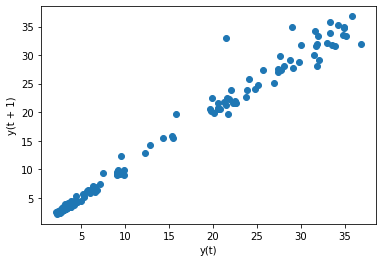

In [80]:
pd.plotting.lag_plot(high_price_nonan.loc[:,'UNIUSDT'])
plt.pyplot.show()

In [79]:
values = pd.DataFrame(high_price_nonan.loc[:,'UNIUSDT'].values)
for i in range(5):
    dataframe = pd.concat([values.shift(i+1), values], axis=1)
    dataframe.columns = ['t-' + str(i+1), 't']
    result = dataframe.corr()
    print(result)

          t-1         t
t-1  1.000000  0.992587
t    0.992587  1.000000
         t-2        t
t-2  1.00000  0.98438
t    0.98438  1.00000
          t-3         t
t-3  1.000000  0.978707
t    0.978707  1.000000
          t-4         t
t-4  1.000000  0.974771
t    0.974771  1.000000
          t-5         t
t-5  1.000000  0.971575
t    0.971575  1.000000


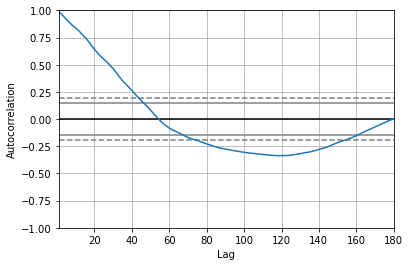

In [83]:
pd.plotting.autocorrelation_plot(high_price_nonan.loc[:,'UNIUSDT'])
plt.pyplot.show()

About Stationary Time Series, REF: https://machinelearningmastery.com/autoregression-models-time-series-forecasting-python/
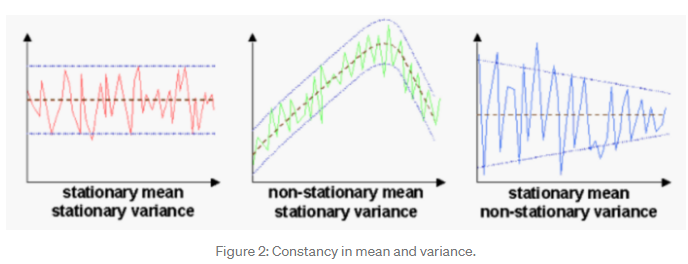

<AxesSubplot:xlabel='Open Time'>

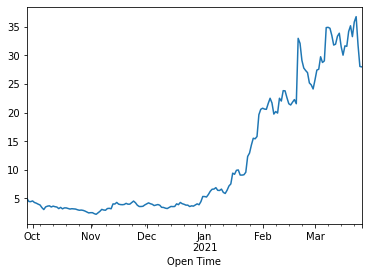

In [88]:
high_price_nonan.loc[:,'UNIUSDT'].plot()
#Non-stationary mean and variance 

A rule of thumb for selecting the right model is to see in our plot if the trend and seasonal variation are relatively constant over time, in other words, linear. If yes, then we will select the Additive model. Otherwise, if the trend and seasonal variation increase or decrease over time then we use the Multiplicative model. REF: https://towardsdatascience.com/time-series-decomposition-in-python-8acac385a5b2

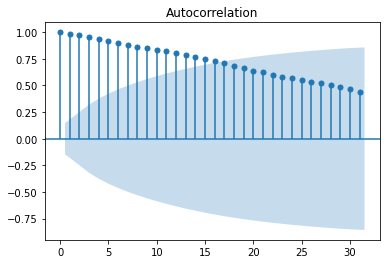

In [125]:
sts.graphics.tsaplots.plot_acf(high_price_nonan.loc[:,'UNIUSDT'], lags=31)
plt.pyplot.show()

AxesSubplot(0.125,0.125;0.775x0.755)


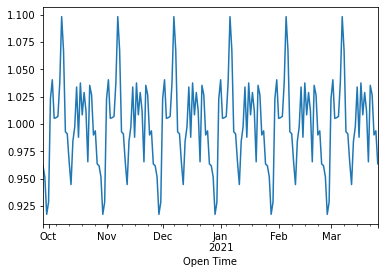

In [121]:
result=sts.tsa.seasonal.seasonal_decompose(high_price_nonan.loc[:,'UNIUSDT'], model='multiplicative', period=30)
print(result.seasonal.plot());

AxesSubplot(0.125,0.125;0.775x0.755)


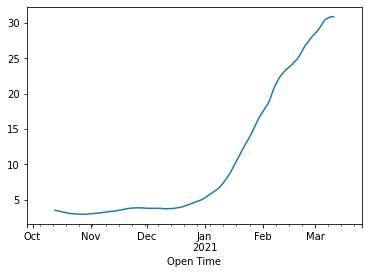

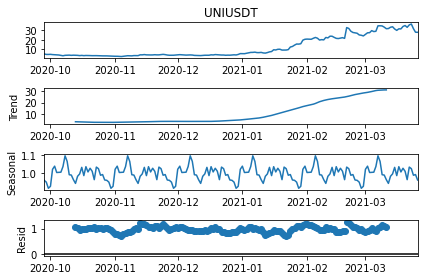

In [122]:
print(result.trend.plot())
result.plot();